## 1. Motivation

### What is your dataset?

### Why did you choose this/these particular dataset(s)?

### What was your goal for the end user's experience?

## 2. Basic stats

### Write about your choices in data cleaning and preprocessing. Write a short section that discusses 

## 3. Tools, theory and analysis. Describe the process of theory to insight

## 4. Discussion. Think critically about your creation

## 5. Code

### Get data and create files

In [ ]:
import requests
from bs4 import BeautifulSoup

import pandas as pd

baseUrl = "https://www.transfermarkt.co.uk";
# Load the webpage containing the data
# The very first thing that we are going to do is create a variable called 
# ‘headers’ and assign it a string that will tell the website that we are a browser, 
# and not a scraping tool. In short, we’ll be blocked if we are thought to be scraping!
headers = {'User-Agent': 
           'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/48.0.2526.106 Safari/537.36'}

page = baseUrl + "/premier-league/startseite/wettbewerb/GB1";
pageTree = requests.get(page, headers=headers)
pageSoup = BeautifulSoup(pageTree.content, 'html.parser')

class Team(object):
    """__init__() functions as the class constructor"""
    def __init__(self, name=None, smallName=None, link=None, codeName=None, idx=None, city=None):
        self.name = name
        self.smallName = smallName
        self.link = link
        self.codeName = codeName
        self.idx = idx
        self.city = city

teams = [];

# Locate the data within a page & extract it
for teamContainer in pageSoup.find_all('td', {"class": "hauptlink no-border-links hide-for-small hide-for-pad"}):
    name = teamContainer.text; # get team name
    link = teamContainer.find('a', {"class": "vereinprofil_tooltip"}); # get team link, but save full url of team
    codeName = link['href'].split('/')[1] # get codeName of each team
    idx = link['href'].split('/')[4] # get team index number
    
    # get team location
    pageLocation = baseUrl + "/" + codeName + "/datenfakten/verein/" + idx;
    pageLocationTree = requests.get(pageLocation, headers=headers)
    pageLocationSoup = BeautifulSoup(pageLocationTree.content, 'html.parser')

    for teamInfo in pageLocationSoup.find_all('table', {"class": "profilheader"}):
        info = teamInfo.find_all('td');
        city = info[2].text.split('(')[0][7:]
    
    teams.append(Team(name, "", baseUrl + link['href'], codeName, idx, city))

In [ ]:
# Locate the data within a page & extract it
i = 0;
for teamSmallNameContainer in pageSoup.find_all('td', {"class": "hauptlink no-border-links show-for-small show-for-pad"}):
    smallName = teamSmallNameContainer.text; # get team's small name
    teams[i].smallName = smallName
    i = i + 1

In [ ]:
# fix team city manually
teams[0].city = "Manchester"
teams[1].city = "Liverpool"
teams[2].city = "London"
teams[3].city = "London"
teams[4].city = "Manchester"
teams[5].city = "London"
teams[6].city = "Liverpool"
teams[7].city = "Leicester"
teams[8].city = "London"
teams[9].city = "Southampton"
teams[10].city = "London"
teams[11].city = "London"
teams[12].city = "Wolverhampton"
teams[13].city = "Bournemouth"
teams[14].city = "Burnley"
teams[15].city = "Brighton"
teams[16].city = "Newcastle"
teams[17].city = "Watford"
teams[18].city = "Huddersfield"
teams[19].city = "Cardiff"

In [ ]:
# write team data to file
f = open("teamData.txt", "w")
for team in teams:
    line = team.name + "!" + team.smallName + "!" + team.link + "!" + team.codeName + "!" + team.idx + "!" + team.city + "\n"; # seperate team data with !
    line = line.encode('utf-8', 'ignore')
    f.write(line)

In [ ]:
# get players of all teams
class Player(object):
    """__init__() functions as the class constructor"""
    def __init__(self, name=None, link=None, codeName=None, idx=None, teams=None):
        self.name = name
        self.link = link
        self.codeName = codeName
        self.idx = idx
        self.teams = teams

players = [];

for team in teams:
    pagePlayers = team.link
    pagePlayersTree = requests.get(pagePlayers, headers=headers)
    pagePlayersSoup = BeautifulSoup(pagePlayersTree.content, 'html.parser')

    i = 1;
    for playerInfo in pagePlayersSoup.find_all('a', {"class": "spielprofil_tooltip"}):
        if (i % 2 != 0):
            name = playerInfo.text
            idx = playerInfo['id']
            link = playerInfo['href']
            codeName = link.split('/')[1]
            players.append(Player(name, baseUrl + link, codeName, idx))
        i = i + 1

In [ ]:
# store team names in an array
tNames = []
for tName in teams:
    tNames.append(tName.name)

In [ ]:
#get players past teams
for player in players:
    pagePlayersTeams = player.link
    pagePlayersTeamsTree = requests.get(pagePlayersTeams, headers=headers)
    pagePlayersTeamsSoup = BeautifulSoup(pagePlayersTeamsTree.content, 'html.parser')

    transferBox = pagePlayersTeamsSoup.find('div', {"class": "box transferhistorie"})

    tempPlayerTeams = [];
    # find player teams
    for playerTeam in transferBox.find_all('td', {"class": "hauptlink no-border-links hide-for-small vereinsname"}):
        teamName = playerTeam.find('a', {"class": "vereinprofil_tooltip"})
        if teamName:
            if teamName.text not in tempPlayerTeams: # avoid duplicate teams
                tempPlayerTeams.append(teamName.text)
    player.teams = tempPlayerTeams;

In [ ]:
# write players data to file
f = open("playersData.txt", "w")
for player in players:
    line = player.name + "!" + player.link + "!" + player.codeName + "!" + player.idx + "!"; # seperate team data with !
    i = 1
    for playerTeam in player.teams:
        if i == len(player.teams):
            line = line + playerTeam
        else:
            line = line + playerTeam + ","
        i = i + 1
    line = line + "\n"
    line = line.encode('utf-8', 'ignore')
    f.write(line)

### Analyze data from created files

### Imports

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

### Read files with data

In [29]:
# read teams data
class Team(object):
    """__init__() functions as the class constructor"""
    def __init__(self, name=None, smallName=None, link=None, codeName=None, idx=None, city=None, numOfPlayers=0):
        self.name = name
        self.smallName = smallName
        self.link = link
        self.codeName = codeName
        self.idx = idx
        self.city = city
        self.numOfPlayers = numOfPlayers

teams = [];

f = open("teamData.txt", "r")
for x in f:
    name = x.split('!')[0]
    smallName = x.split('!')[1]
    link = x.split('!')[2]
    codeName = x.split('!')[3]
    idx = x.split('!')[4]
    city = x.split('!')[5]
    teams.append(Team(name, smallName, link, codeName, idx, city))
    
# read players data
class Player(object):
    """__init__() functions as the class constructor"""
    def __init__(self, name=None, link=None, codeName=None, idx=None, teams=None):
        self.name = name
        self.link = link
        self.codeName = codeName
        self.idx = idx
        self.teams = teams

players = [];

f = open("playersData.txt", "r")
for x in f:
    name = x.split('!')[0]
    link = x.split('!')[1]
    codeName = x.split('!')[2]
    idx = x.split('!')[3]
    teamsPlayed = x.split('!')[4]
    players.append(Player(name, link, codeName, idx, teamsPlayed.split(',')))

### Network

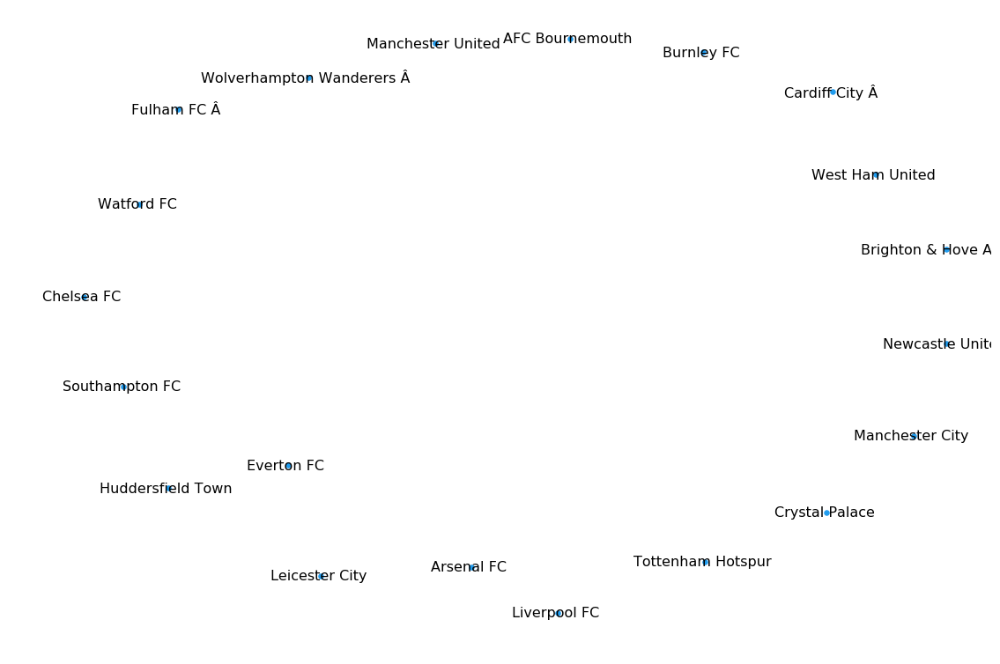

In [30]:
Simple_Network = nx.Graph()
for team in teams:
    Simple_Network.add_node(team.name.decode('unicode_escape'))
    
plt.figure(figsize=(15,10))
nx.draw(Simple_Network,node_size = 30,edge_size=1,edge_labels=0,with_labels=True,font_size=16,node_color='#209cee')
plt.savefig("simple_network.svg")
plt.show()

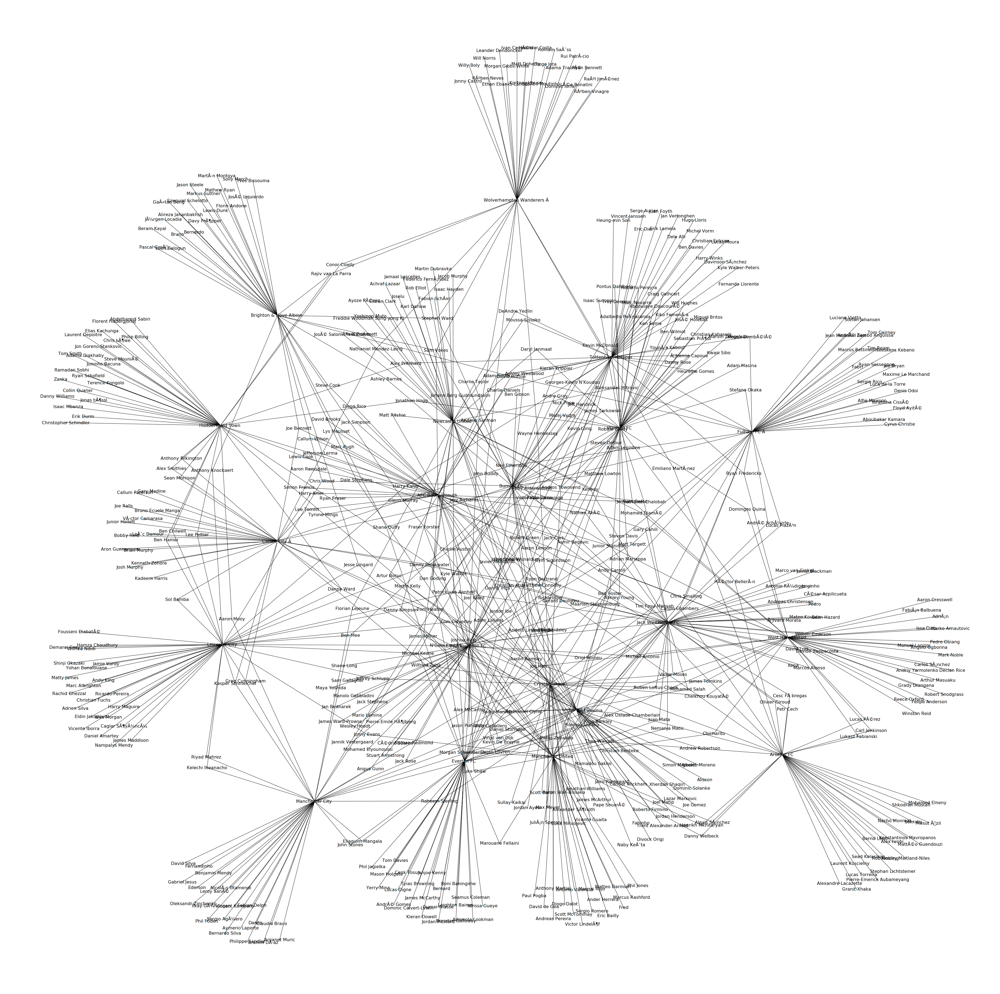

In [31]:
import networkx as nx
Connected_Network = nx.Graph() 

for team in teams:
    Connected_Network.add_node(team.name.decode('unicode_escape'))
    
    for player in players:
        if team.smallName in player.teams:
            Connected_Network.add_edge(player.name.decode('unicode_escape'), team.name.decode('unicode_escape'))
            team.numOfPlayers = team.numOfPlayers + 1 # calculate num of players played for each team
            
plt.figure(figsize=(50,50))
nx.draw(Connected_Network,node_size = 10,edge_size=1,edge_labels=0,with_labels=True,font_size=16,label_pos=0.5,node_color='#209cee')
plt.savefig("network.svg")
plt.show()  

In [49]:
# Sort teams by num of players have played for 
teams.sort(key=lambda x: x.numOfPlayers, reverse=True)

print "Teams with the number of players have played for during their career:\n"
for team in teams:
    print str(team.numOfPlayers) + "  " + team.name

Teams with the number of players have played for during their career:

62  Southampton FC 
56  Chelsea FC 
54  Leicester City 
52  Manchester United 
52  Watford FC 
51  Everton FC 
49  Manchester City 
49  Tottenham Hotspur 
47  Burnley FC 
46  AFC Bournemouth 
46  Huddersfield Town 
44  Liverpool FC 
44  Arsenal FC 
43  West Ham United 
43  Fulham FC  
43  Newcastle United 
41  Crystal Palace 
39  Cardiff City  
38  Brighton & Hove Albion 
37  Wolverhampton Wanderers  


In [50]:
# create a list with the cities the teams belong
class TeamCities(object):
    """__init__() functions as the class constructor"""
    def __init__(self, name=None, numOfPlayers=None):
        self.name = name
        self.numOfPlayers = numOfPlayers
teamCities = []

for team in teams:
    teamCities.append(TeamCities(team.city, 0))

# calculate num of players have played in each city
for teamCity in teamCities:
    for team in teams:
        if (team.city == teamCity.name):
            teamCity.numOfPlayers = teamCity.numOfPlayers + team.numOfPlayers

# Sort team cities by num of players have played in 
teamCities.sort(key=lambda x: x.numOfPlayers, reverse=True)
prevCity = "";
print "Cities with the number of players have played in during their career:\n"
for teamCity in teamCities:
    if teamCity.name != prevCity:
        print str(teamCity.numOfPlayers) + "  " + teamCity.name
    prevCity = teamCity.name

Cities with the number of players have played in during their career:

276  London

101  Manchester

95  Liverpool

62  Southampton

54  Leicester

52  Watford

47  Burnley

46  Bournemouth

46  Huddersfield

43  Newcastle

39  Cardiff

38  Brighton

37  Wolverhampton



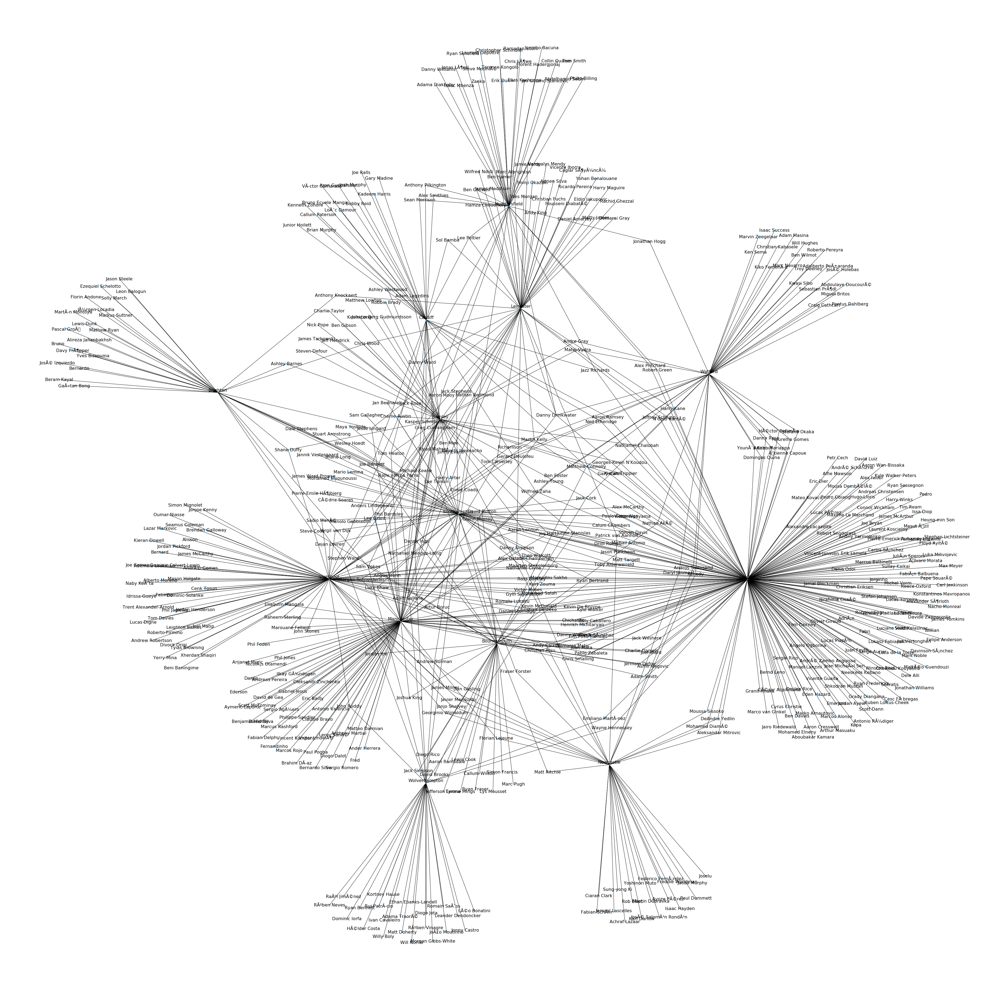

In [56]:
import networkx as nx
Connected_Network_Cities = nx.Graph() 

for teamCity in teamCities:
    Connected_Network_Cities.add_node(teamCity.name.decode('unicode_escape'))
    for player in players:
        for playerTeam in player.teams:
            for team in teams:
                if playerTeam == team.smallName:
                    Connected_Network_Cities.add_edge(player.name.decode('unicode_escape'), team.city.decode('unicode_escape'))
                    
plt.figure(figsize=(50,50))
nx.draw(Connected_Network_Cities,node_size = 10,edge_size=1,edge_labels=0,with_labels=True,font_size=16,label_pos=0.5,node_color='#209cee')
plt.savefig("network_cities.svg")
plt.show()  